## Credit Card customers

### About Dataset:
    *Dataset available at " https://www.kaggle.com/datasets/sakshigoyal7/credit-card-customers " .
#### Problem description - extracted for the "dataset publisher" at the link above:
    A manager at the bank is disturbed with more and more customers leaving their credit card services. They would really 
    appreciate if one could predict for them who is gonna get churned so they can proactively go to the customer to provide 
    them better services and turn customers' decisions in the opposite direction

    Now, this dataset consists of 10,000 customers mentioning their age, salary, marital_status, credit card limit, credit 
    card category, etc. There are nearly 18 features.

    We have only 16.07% of customers who have churned. Thus, it's a bit difficult to train our model to predict churning 
    customers.

## Describing features and checking what needs to be treated


**Attrition_Flag** -> Internal event (customer activity) variable - if the account is closed then 1 else 0 **- We gotta do this change!!!**

**Marital_Status** -> Demographic variable - Married, Single, Divorced, Unknown

**Income_Category** -> Demographic variable - Annual Income Category of the account holder (< $40K, $40K - 60K, $60K - $80K, $80K-$120K, > $120K, Unknown)

**Months_on_book** -> Period of relationship with bank

**Total_Relationship_Count** -> Total no. of products held by the customer

**Months_Inactive_12_mon** -> No. of months inactive in the last 12 months

**Contacts_Count_12_mon** -> No. of Contacts in the last 12 months

**Total_Revolving_Bal** -> Total Revolving Balance on the Credit Card

**Avg_Open_To_Buy** -> Open to Buy Credit Line (Average of last 12 months)

**Total_Amt_Chng_Q4_Q1** -> Change in Transaction Amount (Q4 over Q1)

**Total_Trans_Amt** -> Total Transaction Amount (Last 12 months)

**Total_Trans_Ct** -> Total Transaction Count (Last 12 months)

**Total_Ct_Chng_Q4_Q1** -> Change in Transaction Count (Q4 over Q1)

**Avg_Utilization_Ratio** -> Average Card Utilization Ratio

In [1]:
import pandas as pd
import numpy as np

df_raw = pd.read_csv("BankChurners.csv")
df1 = df_raw.iloc[: , :-2].drop("CLIENTNUM", axis=1)
#advise from "dataset uploader" to delete the last two columns - "naive bayes class..."

df1 = df1.replace(['Existing Customer'], 0) #replacing labels
df1 = df1.replace(['Attrited Customer'], 1)

display(df1)

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,0,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,0,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,0,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,0,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,0,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,0,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,1,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,1,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,1,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


#### I verified below that there is not any null values in our database, and i may have to treat "Income_Category" data type / values.

In [2]:
df1.info()
#here I observe i may have to treat Income_Category data type / values.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  int64  
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

In this project i'm gonna use the PyCaret (an "auto Machine Learning toolkit") librarie to model the problem solution, thus i'm also gonna use a more automated Exploratory Data Analysis tool - the Pandas Profiling - , just to quickly check all the variables/features characteristics and some other details, like the existing correlations.

#### So, taking a look at the Profiling Report, we can observe that:

    Attrition_Flag (our prediction target) has a high correlation with Total_Trans_Ct & 
    Total_Revolving_Bal variables.
        -from the 10127 total reports, only 1627 belong to "Attrited Customer", so, theres a imbalance in our sample 
        regarding target.

    No other problems found in our dataset.

In [3]:
from pandas_profiling import ProfileReport
# generating report with pandas profiling ("auto"-EDA)
profile = ProfileReport(df1, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

First we gonna separate a portion of our dataframe (5% - 506 "new customers") to utilize it as "Unseen Data" later, to simulate the model usage in "future new data".

In [4]:
df2 = df1.sample(frac=0.95, random_state=66)
#stablishing a random sample of 95% of the previous DataFrame to insert into our model.
unseen_data = df1.drop(df2.index) #and 5% random sample left to be unseen_data.

print("Data reports we have to train and test our model: ")
print(len(df2), "\n ")
print("-" * 40)
print("\nData reports left to simulate the model usage: ")
print(len(unseen_data))

Data reports we have to train and test our model: 
9621 
 
----------------------------------------

Data reports left to simulate the model usage: 
506


Now we are importing PyCaret, specifically the classification tools, and we gonna "setup the environment".

*The setup() function initializes the environment in PyCaret and creates the transformation pipeline to prepare the data for modeling and deployment. Thus, it's the first command that must be called before executing any other function in PyCaret. 

**This setup also try to fix imbalance target ("fix_imbalance" arg.), since there's less Attrited Customer data in the target variable than Existing
Customer data.

***Also, PyCaret can automatically perform a cross validation process within setup function (as done here, with default arguments).

****another tasks that are imperative to perform modeling are automatically handled such as missing value imputation (in this case there are no missing values in the analyzed dataset) and categorical encoding (as we may observe by the differences between original data and transformed data shapes - column numbers).

In [5]:
import pycaret

from pycaret.classification import *

setup = setup(data = df2, target = 'Attrition_Flag', train_size = 0.7, fix_imbalance = True, session_id=66)

,Description,Value
0,session_id,66
1,Target,Attrition_Flag
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(9621, 20)"
5,Missing Values,False
6,Numeric Features,10
7,Categorical Features,9
8,Ordinal Features,False
9,High Cardinality Features,False


*Here, PyCaret train and test different models with different applied algorithms, and return the performance metrics.

**In this case, PyCaret doesn't compare some other models that apply, for example, CatBoost or XGBoost (since they are not mandatory dependencies.)

In [6]:
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9702,0.9927,0.8987,0.9185,0.9081,0.8903,0.8907,0.3590
gbc,Gradient Boosting Classifier,0.9620,0.9879,0.8787,0.8894,0.8836,0.8609,0.8612,1.1080
ada,Ada Boost Classifier,0.9504,0.9805,0.8633,0.8397,0.8509,0.8212,0.8216,0.3010
rf,Random Forest Classifier,0.9459,0.9805,0.7592,0.8963,0.8216,0.7900,0.7941,0.5440
dt,Decision Tree Classifier,0.9197,0.8606,0.7728,0.7471,0.7591,0.7109,0.7115,0.0780
et,Extra Trees Classifier,0.9182,0.9594,0.5729,0.8906,0.6960,0.6514,0.6733,0.5240
lda,Linear Discriminant Analysis,0.8551,0.9349,0.8515,0.5377,0.6586,0.5726,0.5975,0.1000
ridge,Ridge Classifier,0.8549,0.0000,0.8515,0.5374,0.6583,0.5723,0.5972,0.0460
knn,K Neighbors Classifier,0.8503,0.8840,0.7973,0.5293,0.6357,0.5463,0.5650,0.1760
lr,Logistic Regression,0.8386,0.9101,0.8063,0.5067,0.6217,0.5260,0.5494,0.5080


We can check how the best performing model was built - a LGBM, an ensemble method that applies gradient boosting decision tree algorithm, and all of its parameters.

In [7]:
print(best_model)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=66, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)


Just plotting the model feature importance.

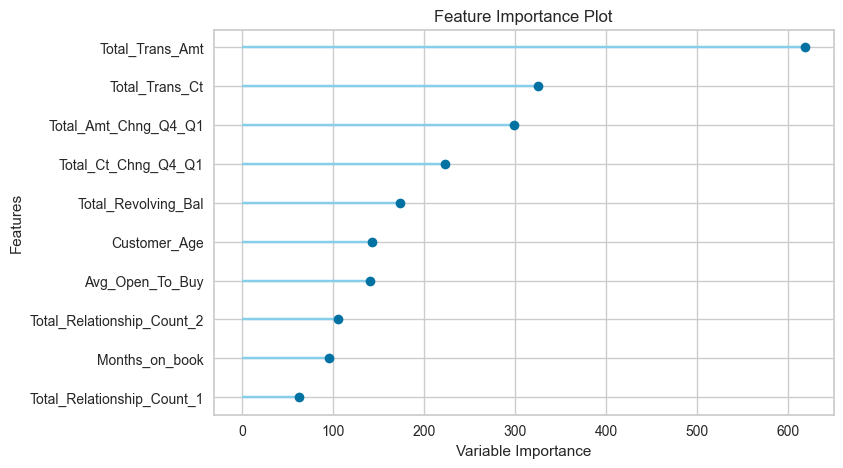

In [8]:
plot_model(best_model, plot='feature')

### Creating two models to tune and compare

#### We gonna create a lightgbm and a random forest model.
* **Both are ensemble methods**, that combine the predictions of several base estimators built with a given learning algorithm in order to improve generalizability / robustness over a single estimator. There's two families of ensemble methods, **averaging methods** (like the random forest), where it builds several estimators independently and then average their predictions; **and boosting methods** (like the LGBM), where base estimators are built sequentially and one tries to reduce the bias of the combined estimator.

#### LightGBM:

Here, we can see that the mean performance metrics are the ones returned in compare_models() function.

In [9]:
lightgbm_churn_model = create_model("lightgbm")

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9570,0.9906,0.8559,0.8796,0.8676,0.8419,0.8420
1,0.9674,0.9926,0.8739,0.9238,0.8981,0.8787,0.8792
2,0.9748,0.9940,0.9189,0.9273,0.9231,0.9080,0.9080
3,0.9688,0.9885,0.8829,0.9245,0.9032,0.8847,0.8850
4,0.9718,0.9937,0.8829,0.9423,0.9116,0.8948,0.8955
5,0.9762,0.9930,0.8909,0.9608,0.9245,0.9104,0.9114
6,0.9747,0.9943,0.9273,0.9189,0.9231,0.9080,0.9080
7,0.9718,0.9944,0.9091,0.9174,0.9132,0.8964,0.8964
8,0.9703,0.9916,0.9000,0.9167,0.9083,0.8905,0.8906


#### We can also check the model parameters/characteristics.

In [10]:
print(lightgbm_churn_model)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=66, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)


#### As we can see, the tuned lgbm model underperforms compared to the untuned one(default parameters).

*The tune_model() function automatically tunes the hyperparameters of a model using Random Grid Search (the default parameter) on a pre-defined search space. The output prints a score grid that shows some metrics by fold for the best model.

In [11]:
tuned_lgbm_churn_model = tune_model(lightgbm_churn_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9674,0.9897,0.8919,0.9083,0.9000,0.8805,0.8806
1,0.9644,0.9896,0.8649,0.9143,0.8889,0.8677,0.8682
2,0.9718,0.9923,0.9009,0.9259,0.9132,0.8964,0.8965
3,0.9674,0.9796,0.8829,0.9159,0.8991,0.8796,0.8798
4,0.9599,0.9893,0.8559,0.8962,0.8756,0.8517,0.8520
5,0.9584,0.9868,0.8364,0.9020,0.8679,0.8433,0.8441
6,0.9614,0.9891,0.8818,0.8818,0.8818,0.8587,0.8587
7,0.9703,0.9924,0.9091,0.9091,0.9091,0.8913,0.8913
8,0.9539,0.9835,0.8000,0.9072,0.8502,0.8232,0.8254


In [12]:
print(tuned_lgbm_churn_model)

LGBMClassifier(bagging_fraction=0.5, bagging_freq=2, boosting_type='gbdt',
               class_weight=None, colsample_bytree=1.0, feature_fraction=0.4,
               importance_type='split', learning_rate=0.5, max_depth=-1,
               min_child_samples=16, min_child_weight=0.001, min_split_gain=0.3,
               n_estimators=210, n_jobs=-1, num_leaves=20, objective=None,
               random_state=66, reg_alpha=0.0001, reg_lambda=0.1, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)


#### Random Forest:

In [13]:
rf_churn_model = create_model("rf")

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9540,0.9777,0.8108,0.9000,0.8531,0.8259,0.8275
1,0.9451,0.9754,0.7387,0.9111,0.8159,0.7841,0.7900
2,0.9555,0.9832,0.8018,0.9175,0.8558,0.8296,0.8322
3,0.9466,0.9781,0.7568,0.9032,0.8235,0.7923,0.7967
4,0.9525,0.9850,0.7568,0.9438,0.8400,0.8125,0.8193
5,0.9450,0.9820,0.7182,0.9294,0.8103,0.7787,0.7876
6,0.9435,0.9825,0.7818,0.8600,0.8190,0.7857,0.7869
7,0.9346,0.9784,0.7364,0.8438,0.7864,0.7480,0.7504
8,0.9376,0.9795,0.7273,0.8696,0.7921,0.7557,0.7599


In [14]:
print(rf_churn_model)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=66, verbose=0,
                       warm_start=False)


#### As we can see, the tuned rf model also underperforms compared to the untuned one(default parameters), except in precision.

In [15]:
tuned_rf_churn_model = tune_model(rf_churn_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9407,0.9657,0.8468,0.8034,0.8246,0.7889,0.7893
1,0.9392,0.9689,0.7928,0.8302,0.8111,0.7748,0.7751
2,0.9377,0.9724,0.8198,0.8053,0.8125,0.7751,0.7752
3,0.9318,0.9632,0.7838,0.7982,0.7909,0.7501,0.7502
4,0.9421,0.9782,0.7568,0.8750,0.8116,0.7776,0.7804
5,0.9331,0.9691,0.7182,0.8495,0.7783,0.7393,0.7429
6,0.9257,0.9744,0.7455,0.7885,0.7664,0.7222,0.7226
7,0.9198,0.9602,0.7273,0.7692,0.7477,0.7000,0.7004
8,0.9376,0.9694,0.8091,0.8091,0.8091,0.7718,0.7718


In [16]:
print(tuned_rf_churn_model)

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='entropy',
                       max_depth=8, max_features='sqrt', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0001,
                       min_impurity_split=None, min_samples_leaf=4,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       n_estimators=80, n_jobs=-1, oob_score=False,
                       random_state=66, verbose=0, warm_start=False)


Metrics alone are not the only criteria you should consider when finalizing the best model for production. Other factors to consider include training time, standard deviation of kfolds, etc.

### So, we gonna consider the lightGBM model the best by now.

#### As we can observe, all the performance metrics raised when predicting the test_data target, but...
*They are not materially different than the CV results, only Kappa and MCC metrics are ~2% better.

    - so, i believe it's everything okay concerning the model fitting.

cv_mean 0.9702	0.9927	0.9842	0.9802	0.9822	0.8903	0.8907

test____ 0.9775	0.9937	0.9890	0.9845	0.9867	0.9120	0.9121


In [17]:
df_predict_model = predict_model(lightgbm_churn_model)

display(df_predict_model)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.9775,0.9937,0.9136,0.9371,0.9252,0.9120,0.9121


,Customer_Age,Months_on_book,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_F,...,Contacts_Count_12_mon_0,Contacts_Count_12_mon_1,Contacts_Count_12_mon_2,Contacts_Count_12_mon_3,Contacts_Count_12_mon_4,Contacts_Count_12_mon_5,Contacts_Count_12_mon_6,Attrition_Flag,Label,Score
0,46.0,36.0,0.0,1438.300049,0.951,4374.0,71.0,0.775,0.000,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0.9980
1,41.0,28.0,1426.0,3395.000000,0.898,3571.0,58.0,0.933,0.296,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0,0,0.9990
2,28.0,17.0,1488.0,10393.000000,0.587,4865.0,87.0,0.891,0.125,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0,0,0.9996
3,43.0,36.0,0.0,14418.000000,1.043,3880.0,68.0,0.700,0.000,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.9991
4,49.0,39.0,2203.0,701.000000,0.796,3848.0,66.0,0.692,0.759,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0,0,0.9985
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2882,46.0,28.0,1259.0,33257.000000,0.671,4300.0,94.0,0.741,0.036,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0.9998
2883,55.0,35.0,1973.0,14014.000000,0.705,7345.0,98.0,0.463,0.123,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0.9997
2884,47.0,41.0,1556.0,2651.000000,0.658,15312.0,122.0,0.718,0.370,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0.9998
2885,38.0,22.0,1595.0,32921.000000,0.824,8871.0,97.0,0.764,0.046,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0.9997


Just plotting the confusion matrix for the predicted data.

The model did pretty well, with a Recall of 0.9136 (i believe the recall is the best metric to observe in this case, because i want to avoid False Negatives).

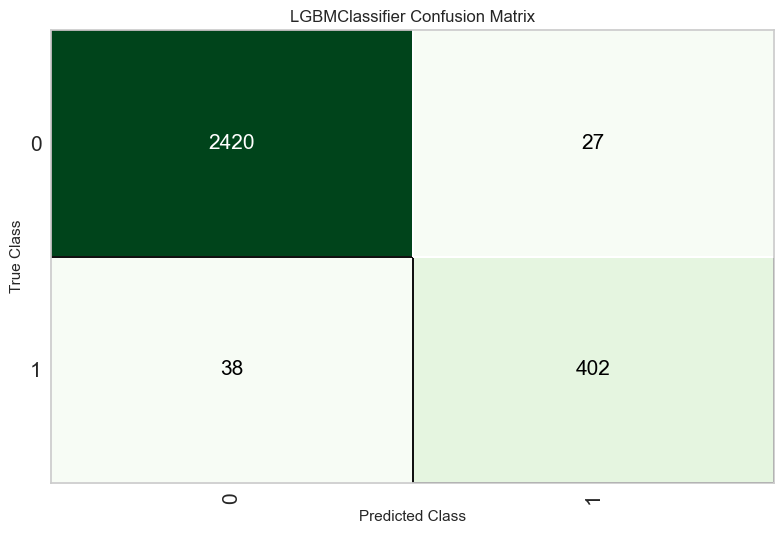

In [18]:
plot_model(lightgbm_churn_model, plot='confusion_matrix')

### Finalize Model
The finalize_model() function fits the model onto the complete dataset including the test/hold-out sample (30% in this case).

The purpose of this function is to train the model on the complete dataset before it is deployed in production.

In [19]:
final_lgbm_churn_model = finalize_model(lightgbm_churn_model)

print(final_lgbm_churn_model)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=66, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)


### Predict on unseen data

In [20]:
unseen_data_predict_model = predict_model(final_lgbm_churn_model, data=unseen_data)
display(unseen_data_predict_model)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.9822,0.9980,0.9268,0.9620,0.9441,0.9335,0.9338


,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Label,Score
12,0,56,M,1,College,Single,$80K - $120K,Blue,36,3,...,11751.0,0,11751.0,3.397,1539,17,3.250,0.000,0,0.9973
42,0,50,F,1,College,Single,$40K - $60K,Silver,43,3,...,17304.0,2517,14787.0,1.449,1756,33,1.200,0.145,0,0.9952
51,1,54,F,1,Graduate,Married,Less than $40K,Blue,40,2,...,1438.3,808,630.3,0.997,705,19,0.900,0.562,1,0.9897
63,0,44,M,4,Post-Graduate,Single,$120K +,Blue,32,2,...,23957.0,2102,21855.0,0.997,1276,26,0.733,0.088,0,0.7515
84,0,53,M,1,Graduate,Divorced,$80K - $120K,Blue,35,5,...,34516.0,1219,33297.0,1.129,1590,27,2.000,0.035,0,0.9990
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10015,0,48,F,4,College,Unknown,Unknown,Blue,36,3,...,3310.0,0,3310.0,0.748,14542,89,0.854,0.000,0,0.9592
10034,1,56,M,4,Graduate,Divorced,$60K - $80K,Blue,36,6,...,6224.0,0,6224.0,0.920,8979,68,0.581,0.000,1,0.9934
10039,0,38,M,2,Unknown,Married,$120K +,Blue,36,6,...,3782.0,0,3782.0,0.717,14977,117,0.721,0.000,0,0.9988
10041,0,56,M,2,Unknown,Married,$60K - $80K,Blue,49,3,...,4058.0,793,3265.0,0.758,15865,105,0.667,0.195,0,0.9994


#### Producing a confusion matrix to check the predictions on the unseen data and checking the performance metrics.

We can observe that the model did really well on the simulation with the unseen data. It missed the classification of 6 customers with a high potential of Churn, from a total of 86 - Recall score of 0.9268!

* If we manually tune the model, it may perform even better.
* If we use the other 5%  of the data left for the "Unseen Data", we may have an even better model.

In [21]:
from sklearn.metrics import confusion_matrix
confusion_matrix(unseen_data_predict_model["Attrition_Flag"], unseen_data_predict_model["Label"])

array([[421,   3],
       [  6,  76]], dtype=int64)

In [22]:
from sklearn.metrics import accuracy_score
accuracy_score(unseen_data_predict_model["Attrition_Flag"], unseen_data_predict_model["Label"])

0.9822134387351779

In [23]:
from sklearn.metrics import precision_score

precision_score(unseen_data_predict_model["Attrition_Flag"], unseen_data_predict_model["Label"])

0.9620253164556962

In [24]:
from sklearn.metrics import recall_score

recall_score(unseen_data_predict_model["Attrition_Flag"], unseen_data_predict_model["Label"])

0.926829268292683

In [25]:
from sklearn.metrics import classification_report
print(classification_report(unseen_data_predict_model["Attrition_Flag"], unseen_data_predict_model["Label"]))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       424
           1       0.96      0.93      0.94        82

    accuracy                           0.98       506
   macro avg       0.97      0.96      0.97       506
weighted avg       0.98      0.98      0.98       506



#### Just plotting the AUC:

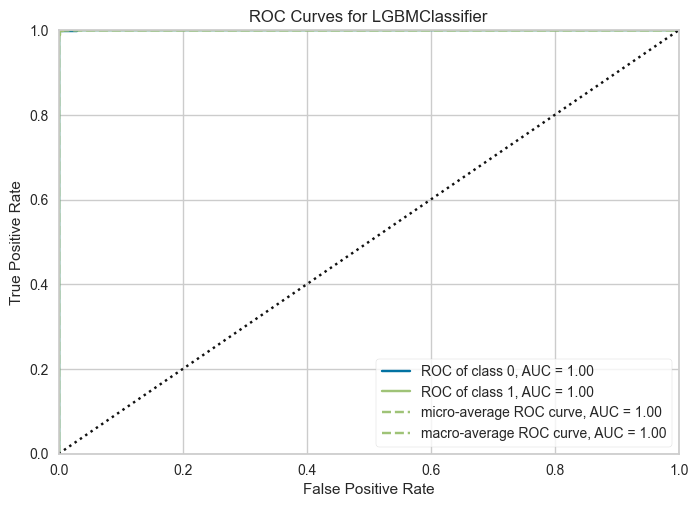

In [26]:
plot_model(final_lgbm_churn_model, plot = 'auc')

### Saving the model

We have now finished the model. In order to predict more new data without the need to go through the entire experiment again, PyCaret has the save_model() function that allows you to save the model along with the entire transformation pipeline in a *pkl file format archive for later use (with the load_model() function).

In [27]:
save_model(final_lgbm_churn_model,'Final_LGBM_Model_20220830_V1')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[],
                                       target='Attrition_Flag',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numer...
                  LGBMClassifier(boosting_type='gbdt', class_weight=None,
                                 colsample_bytree=1.0, importance_type='split',
                                 learning_rate=0.1, max_depth=-1,
               

## Conclusions

- We can see that **PyCaret** really do what it promisses, and really facilitates the development of a wide diversity of classification models.


- Of course we can't replace all the exploratory data analysis by an superficial Pandas Profiling report, nor we can't replace the whole proccess of a prediction data product by a superficial PyCaret setup and tune. But when we dive deeper in these toolkits, we can really extract potential from them and develop our analyses supported by them.


- Also, PyCaret is an **awesome tool to define a baseline model**, with an already good working model. So, we can start from a selected model and manually tune and polish it till it attends our expectations.
    - it was not done here, but it's an **awesome tool for Feature Engineering too!**


- **The metrics** by themselves can mean not much. We gotta analyse our specific problem case (our objective and the data available) so we can decide the metric that better describes and make clear our model performance monitoring.